https://github.com/ultralytics/ultralytics/issues/2066

In [1]:
#!pip install ultralytics==8.0.28
!pip install ultralytics

!pip install gdown 

from IPython import display
display.clear_output()

In [2]:

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.0 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Setup complete ✅ (8 CPUs, 59.9 GB RAM, 31.5/193.8 GB disk)


In [3]:
!nvidia-smi

Sat Jun  3 13:31:11 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  On   | 00000000:00:1E.0 Off |                    0 |
| N/A   54C    P0    30W / 300W |      2MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
! pip install -q kaggle

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json


mkdir: cannot create directory ‘/home/ubuntu/.kaggle’: File exists


In [5]:
import os
import zipfile

# Specify the desired path
download_path = "../Downloads"
zip_file = os.path.join(download_path, "lumbar.zip")

if not os.path.exists(zip_file):

    # Create the directory if it doesn't exist
    os.makedirs(download_path, exist_ok=True)

    # Download the dataset to the specified path
    !kaggle competitions download -c lumbar -p {download_path}

    # Unzip the downloaded file
    zip_file = os.path.join(download_path, "lumbar.zip")
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(download_path)


In [6]:
import os
import pandas as pd
import numpy as np
import random

def create_label_dataframe(image_files):
    labels = []
    csvs   = []
    for file_path in image_files:
        # Assuming the folder containing the image file is the label
        label = os.path.basename(os.path.dirname(file_path))
        csv_file = file_path.replace('.jpg','.csv')
        labels.append(label)
        csvs.append(csv_file)

    data = {'img_Path': image_files , 'Label': labels}
    df = pd.DataFrame(data)
    return df

def find_image_files(folder_path):
    image_files = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                image_files.append(os.path.join(root, file))
    return image_files


folder_path = "BUU-LSPINE (Vertebral position)/train"  # Replace with the actual folder path


image_files = find_image_files(folder_path)
df = create_label_dataframe(image_files)
df['index'] = df['Label'].map({'AP':0,'LA':1})



df =df[df['Label']=='AP']

df

,img_Path,Label,index
400,BUU-LSPINE (Vertebral position)/train/AP/375_A...,AP,0
401,BUU-LSPINE (Vertebral position)/train/AP/344_A...,AP,0
402,BUU-LSPINE (Vertebral position)/train/AP/310_A...,AP,0
403,BUU-LSPINE (Vertebral position)/train/AP/76_AP...,AP,0
404,BUU-LSPINE (Vertebral position)/train/AP/84_AP...,AP,0
...,...,...,...
795,BUU-LSPINE (Vertebral position)/train/AP/379_A...,AP,0
796,BUU-LSPINE (Vertebral position)/train/AP/211_A...,AP,0
797,BUU-LSPINE (Vertebral position)/train/AP/37_AP...,AP,0
798,BUU-LSPINE (Vertebral position)/train/AP/139_A...,AP,0


In [7]:

def ReadAllBox_csv(img_file):

    csv_file = img_file.replace('.jpg','.csv')

    data = np.loadtxt(csv_file, delimiter=',', dtype=np.float32)

    D   = []
    Cls = []
    for i in range(0,10,2) :
        d = np.array(data[i,:-1].tolist()+ data[i+1,2:4].tolist() + data[i+1,0:2].tolist() )
        cls =i/2
        Cls.append(cls)
        D.append(d)
    return np.array(D)


img_file = random.choice(df['img_Path'].tolist())
D        =  ReadAllBox_csv(img_file)

D.shape

(5, 8)

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2


def draw_line_Up(image_cv, Line , color, thickness):

    Hight,Weight      = image_cv.shape[:2]
    x0, y0, x1, y1    = Line 
    x0,y0,x1,y1       = x0*Weight,y0*Hight,x1*Weight,y1*Hight

    # Draw a line using OpenCV
    start_point = (int(x0), int(y0))
    end_point = (int(x1), int(y1))
    cv2.line(image_cv, start_point, end_point, color, thickness)
    return image_cv

def draw_line_Down(image_cv, Line , color, thickness):

    Hight,Weight      = image_cv.shape[:2]
    x1, y1, x0, y0    = Line 
    x0,y0,x1,y1       = x0*Weight,y0*Hight,x1*Weight,y1*Hight

    # Draw a line using OpenCV
    start_point = (int(x0), int(y0))
    end_point = (int(x1), int(y1))
    cv2.line(image_cv, start_point, end_point, color, thickness)
    return image_cv


def  draw_box(image_cv, D , color, thickness):
   
    draw_line_Up(image_cv,D[0:4], color, thickness)
    draw_line_Down(image_cv,D[4:], color, thickness)
   
    return image_cv





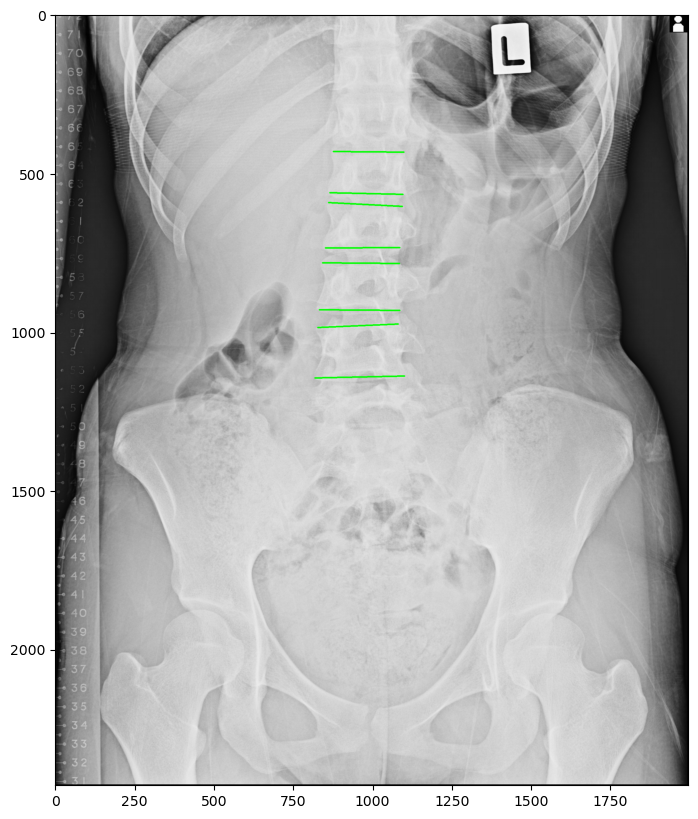

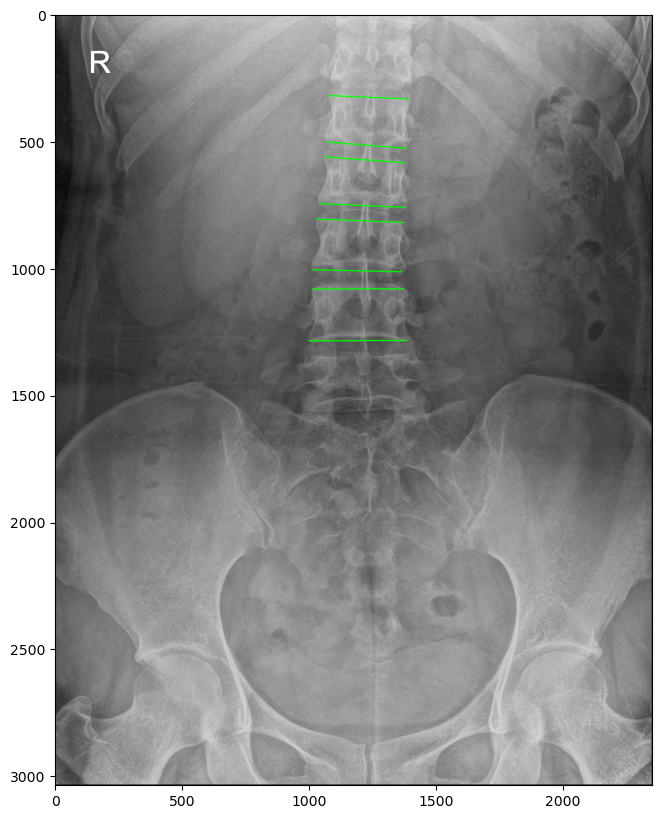

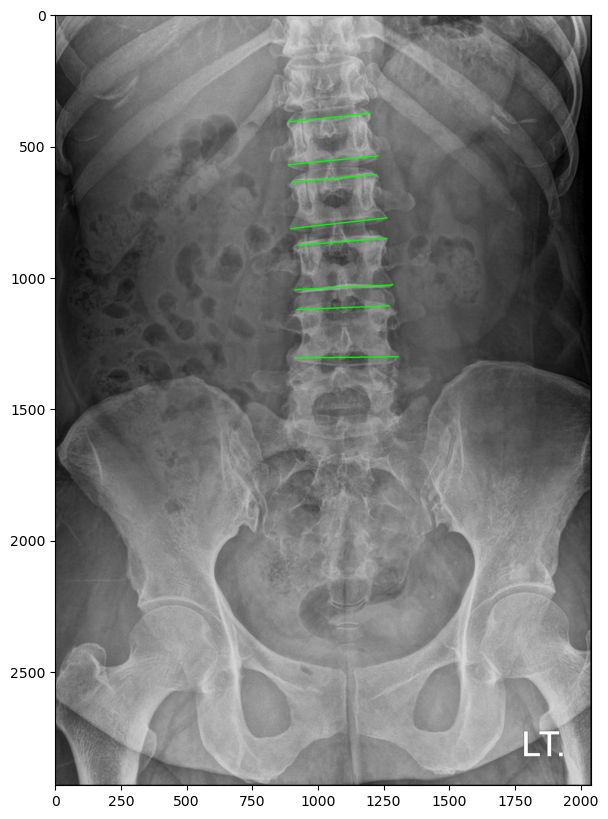

In [9]:
import random

for j in range(3) :

    img_file = random.choice(df['img_Path'].tolist())
    image_cv          = cv2.imread(img_file)
    D                 =  ReadAllBox_csv(img_file)

    for i in range(4) :
      image = draw_box(image_cv, D[i] , (0,255,0), 3)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

In [10]:
def create_txt_yolo(savepath,img_file):
     
     output_file = savepath +"/" + os.path.basename(img_file).replace('.jpg','.txt') 
     D = ReadAllBox_csv(img_file)
     with open(output_file, 'w') as f:
        for cls in range(len(D)):
            line = f'{0}'
            for j in range(8):
                line += f' {D[cls][j]:.18f}'
            line += '\n'    

            f.write(line)


df0 =df.loc[0:1]

Z = df0['img_Path'].apply(lambda x: create_txt_yolo('.',x))

In [11]:
df

,img_Path,Label,index
400,BUU-LSPINE (Vertebral position)/train/AP/375_A...,AP,0
401,BUU-LSPINE (Vertebral position)/train/AP/344_A...,AP,0
402,BUU-LSPINE (Vertebral position)/train/AP/310_A...,AP,0
403,BUU-LSPINE (Vertebral position)/train/AP/76_AP...,AP,0
404,BUU-LSPINE (Vertebral position)/train/AP/84_AP...,AP,0
...,...,...,...
795,BUU-LSPINE (Vertebral position)/train/AP/379_A...,AP,0
796,BUU-LSPINE (Vertebral position)/train/AP/211_A...,AP,0
797,BUU-LSPINE (Vertebral position)/train/AP/37_AP...,AP,0
798,BUU-LSPINE (Vertebral position)/train/AP/139_A...,AP,0


In [12]:
import shutil

mode = "train"

def Create_Yolo_Dataset(mode='train', df =df):

    if not os.path.exists("datasets"):
        os.mkdir("datasets")   
        
        
    mainfloder = f"./datasets/{mode}"
    main_image_floder = f"{mainfloder}/images"
    main_label_floder = f"{mainfloder}/labels"

    if not os.path.exists(mainfloder):
        os.mkdir(mainfloder)
    if not os.path.exists(main_image_floder):
        os.mkdir(main_image_floder)
    if not os.path.exists(main_label_floder):
        os.mkdir(main_label_floder)

    # copy image
    df['img_Path'].apply(lambda x: shutil.copy(x, main_image_floder+"/"+os.path.basename(x)))  

    # Copy label
    df['img_Path'].apply(lambda x: create_txt_yolo(main_label_floder,x))



if os.path.exists("datasets"):
     shutil.rmtree("datasets")

Create_Yolo_Dataset(mode='train', df =df)   
Create_Yolo_Dataset(mode='test', df =df)   

In [13]:
import yaml

data = {
    'train': './train/images', # Path to the directory containing training images
    'val': './test/images', # Path to the directory containing validation images
    'names': ['0']# List of class names
}

with open('dataset.yaml', 'w') as outfile:
    yaml.dump(data, outfile)

In [14]:
from ultralytics import YOLO
import torch


import multiprocessing

def get_cpu_core_count():
    return multiprocessing.cpu_count()


model = YOLO("yolov8l-seg.pt")


model_params = {
    'data': "dataset.yaml",
    'epochs': 50,
    'batch': 16,
    'imgsz': 720,
    'device': '0' if torch.cuda.is_available() else "cpu",
    'lr0':0.005,
    'lrf':0.005,
   
     'workers': 8,
     #'resume':True,

    'name': 'Y2_20.5_',
    'plots': True,
    'save': True,

    #'close_mosaic':5,
    "hsv_h": 0.015, # image HSV-Hue augmentation (fraction)
    "hsv_s": 0.7, # image HSV-Saturation augmentation (fraction)
    "hsv_v": 0.4, # image HSV-Value augmentation (fraction)
    "degrees": 10, # image rotation (+/- deg)
    "translate": 0.35, # image translation (+/- fraction)
    "scale": 0.5, # image scale (+/- gain)
    "shear": 3, # image shear (+/- deg)
    "perspective": 0, # image perspective (+/- fraction), range 0-0.001
    "flipud": 0, # image flip up-down (probability)
    "fliplr": 0, # image flip left-right (probability)
    "mosaic": 0.5, # image mosaic (probability)
    "mixup": 0.3, # image mixup (probability)
    "copy_paste": 0, # segment copy-paste (probability),
    
    } 

model_params['workers'] = get_cpu_core_count() if model_params['device']=='0'  else 2
                      
       
model_params

{'data': 'dataset.yaml',
 'epochs': 50,
 'batch': 16,
 'imgsz': 720,
 'device': '0',
 'lr0': 0.005,
 'lrf': 0.005,
 'workers': 8,
 'name': 'Y2_20.5_',
 'plots': True,
 'save': True,
 'hsv_h': 0.015,
 'hsv_s': 0.7,
 'hsv_v': 0.4,
 'degrees': 10,
 'translate': 0.35,
 'scale': 0.5,
 'shear': 3,
 'perspective': 0,
 'flipud': 0,
 'fliplr': 0,
 'mosaic': 0.5,
 'mixup': 0.3,
 'copy_paste': 0}

In [15]:


results = model.train( **model_params)

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.0 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8l-seg.pt, data=dataset.yaml, epochs=50, patience=50, batch=16, imgsz=720, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=Y2_20.5_, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=F

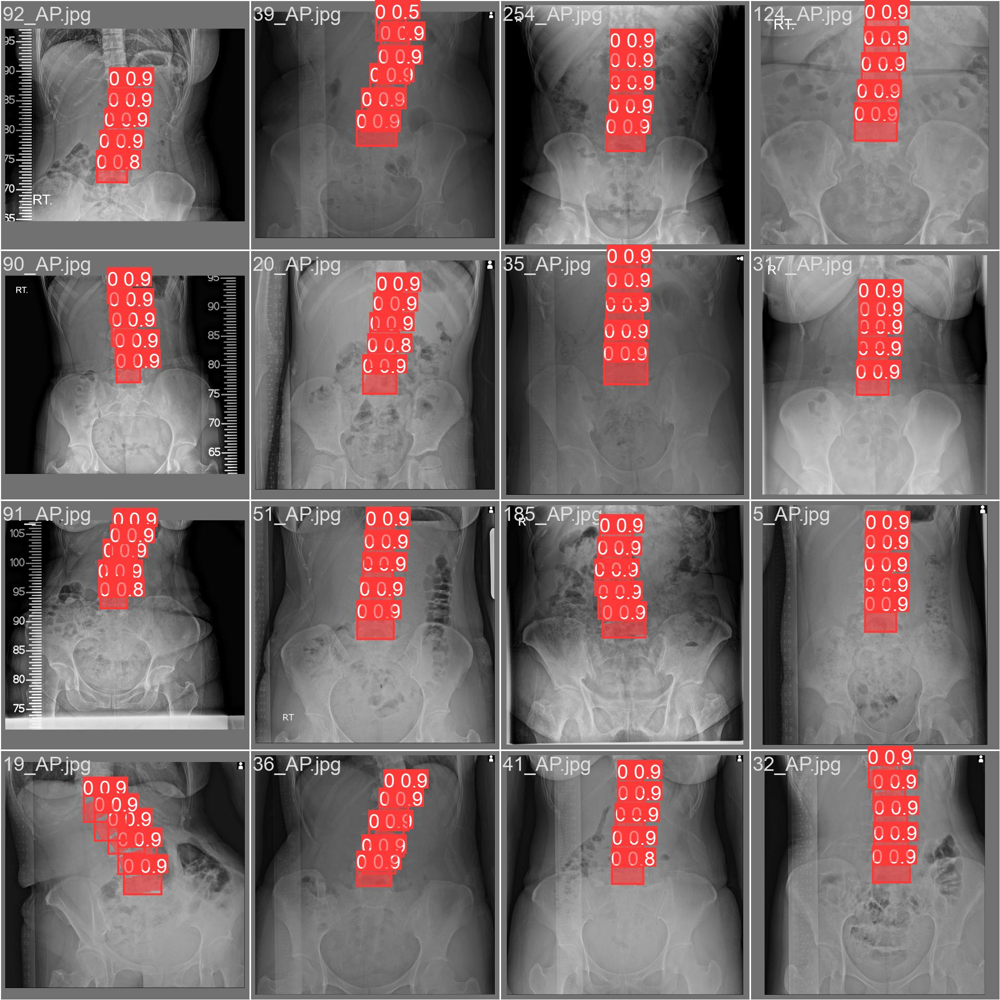

In [17]:
from IPython.display import display, Image
import os

Name_experiment = "Y2_20.5_"

file_path = f'/content/runs/segment/{Name_experiment}/val_batch0_pred.jpg'
Image(filename=f'./runs/segment/{Name_experiment}/val_batch0_pred.jpg', width=1200)

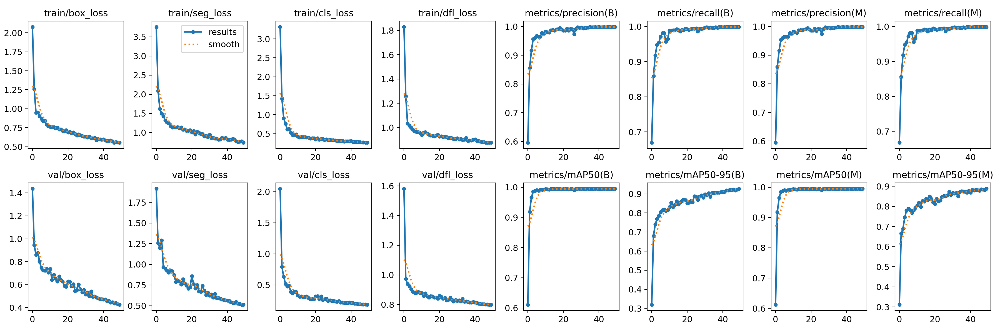

In [18]:
import os
from IPython.display import display, Image

file_path = f'./runs/segment/{Name_experiment}/results.png'

if os.path.exists(file_path):
    display(Image(filename=file_path, width=1200))
else:
    print("File does not exist")


In [19]:
def find_image_files(folder_path):
    image_files = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                image_files.append(os.path.join(root, file))
    return image_files


path = "BUU-LSPINE (Vertebral position)/train/AP"

LAPfiles = find_image_files(path)


In [20]:
!pwd

/home/ubuntu/Lumbar-Spine-zero


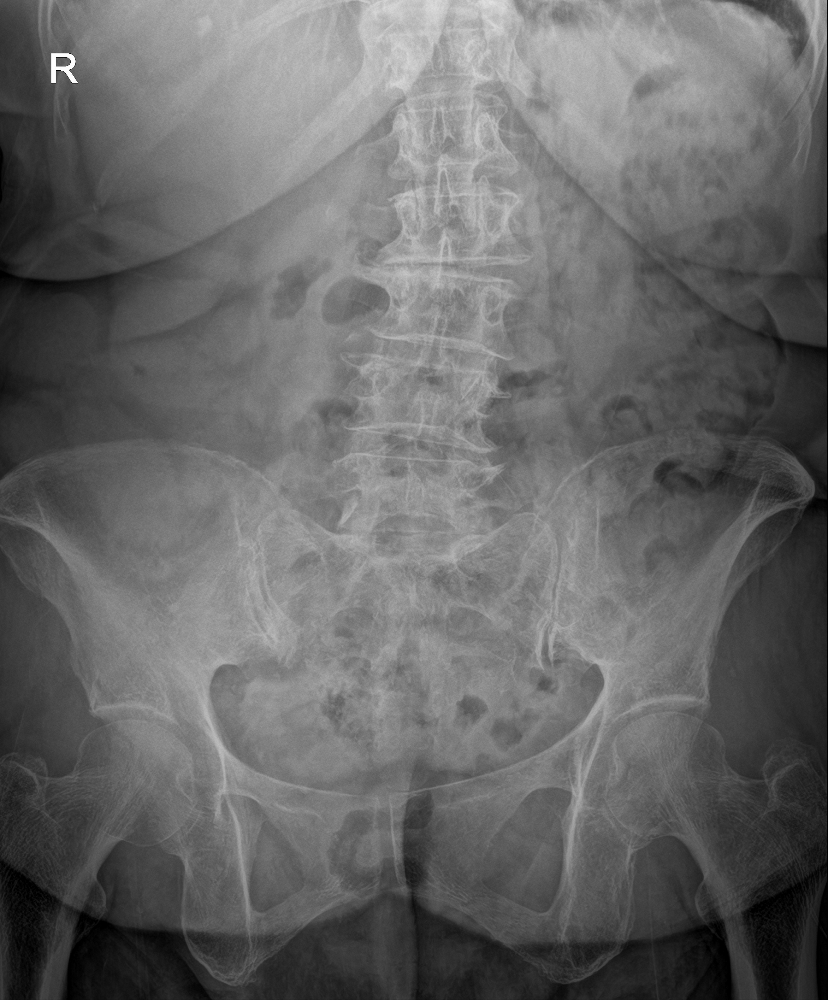

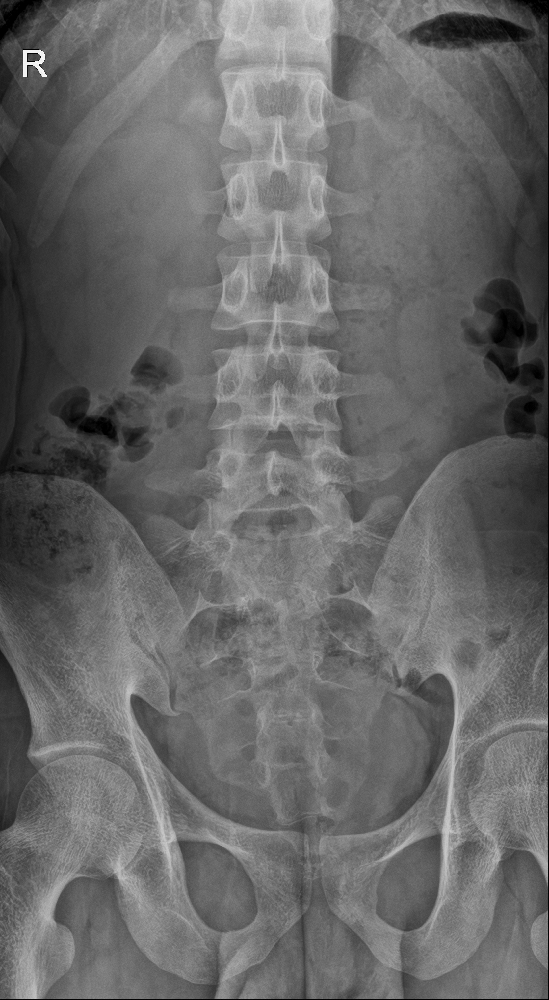

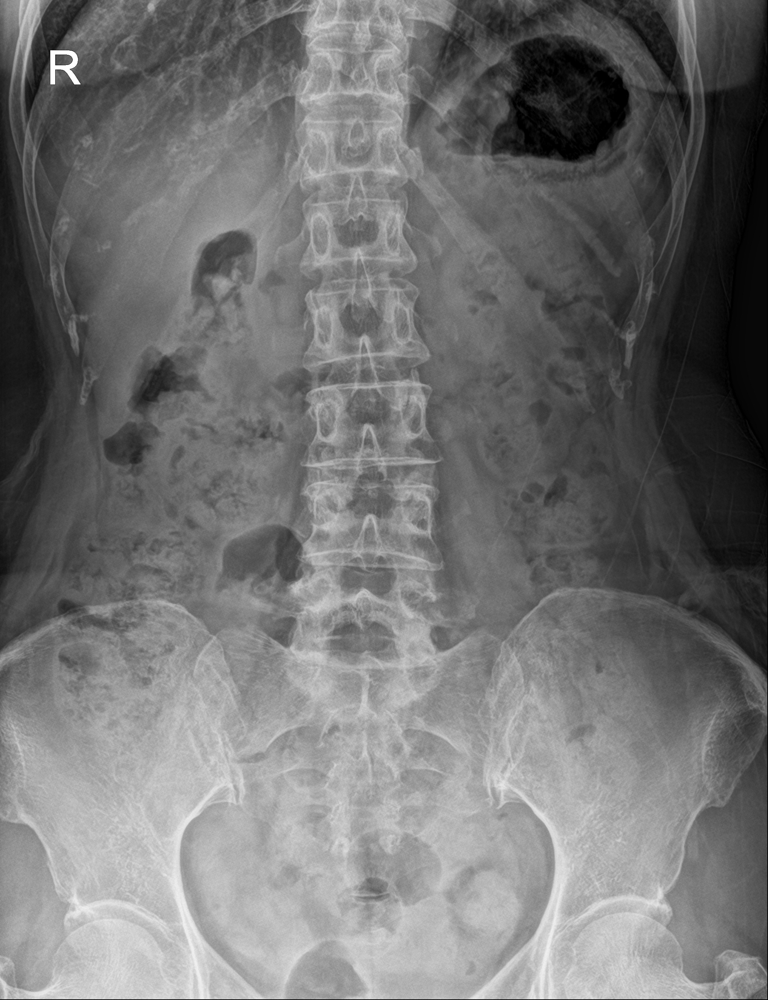

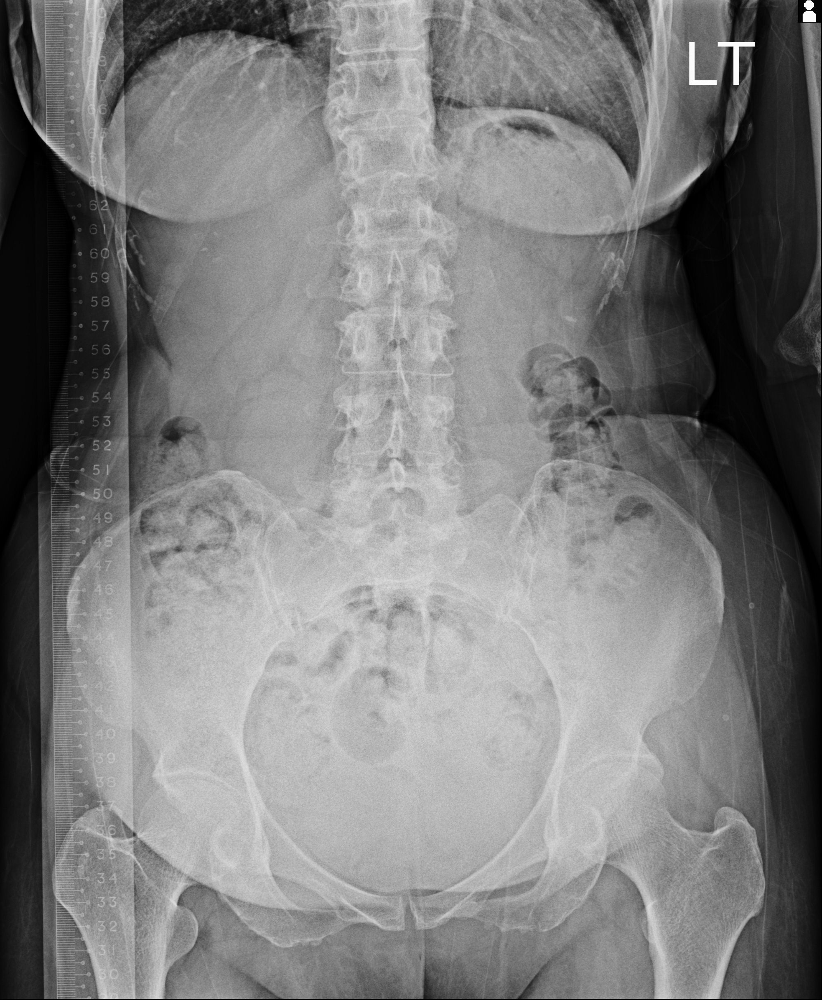

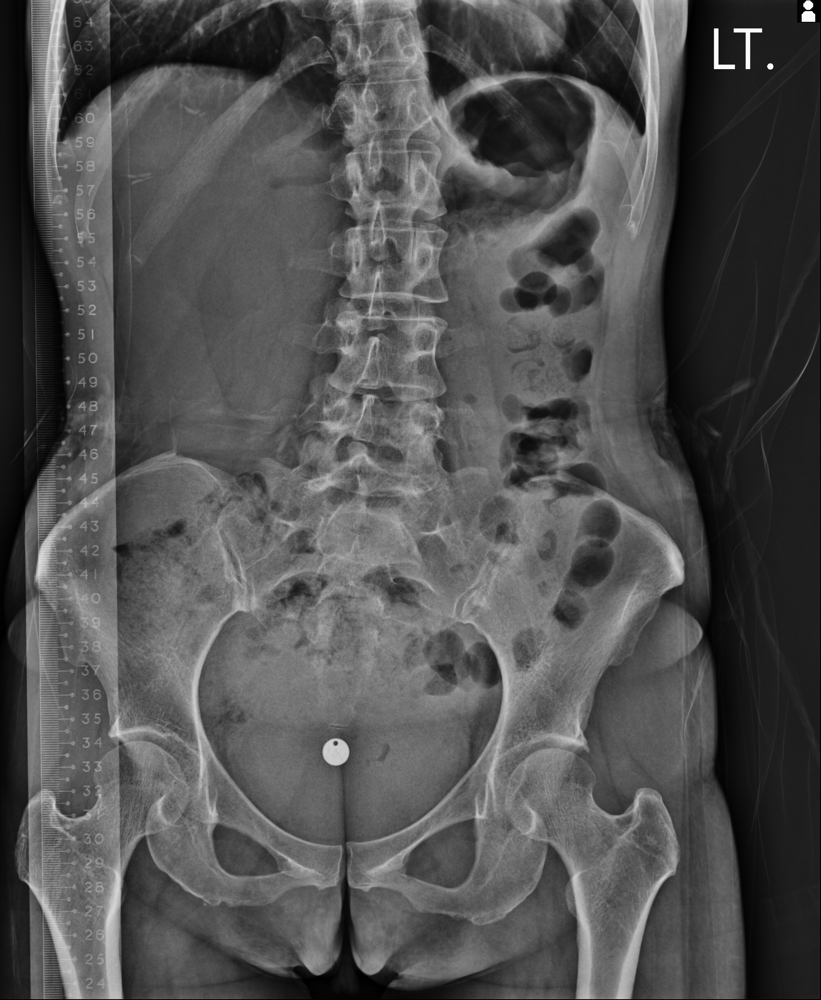

In [21]:
import glob
from IPython.display import Image, display

for image_path in LAPfiles[:5]:
      display(Image(filename=image_path, width=500))
      print("\n")

In [30]:
from ultralytics import YOLO
import numpy as np
import torch



model = YOLO('./runs/segment/Y2_20.5_/weights/best.pt')
model


image 1/1 /home/ubuntu/Lumbar-Spine-zero/BUU-LSPINE (Vertebral position)/train/AP/375_AP.jpg: 736x640 5 0s, 20.1ms
Speed: 4.1ms preprocess, 20.1ms inference, 3.3ms postprocess per image at shape (1, 3, 736, 736)


1
2
3
4


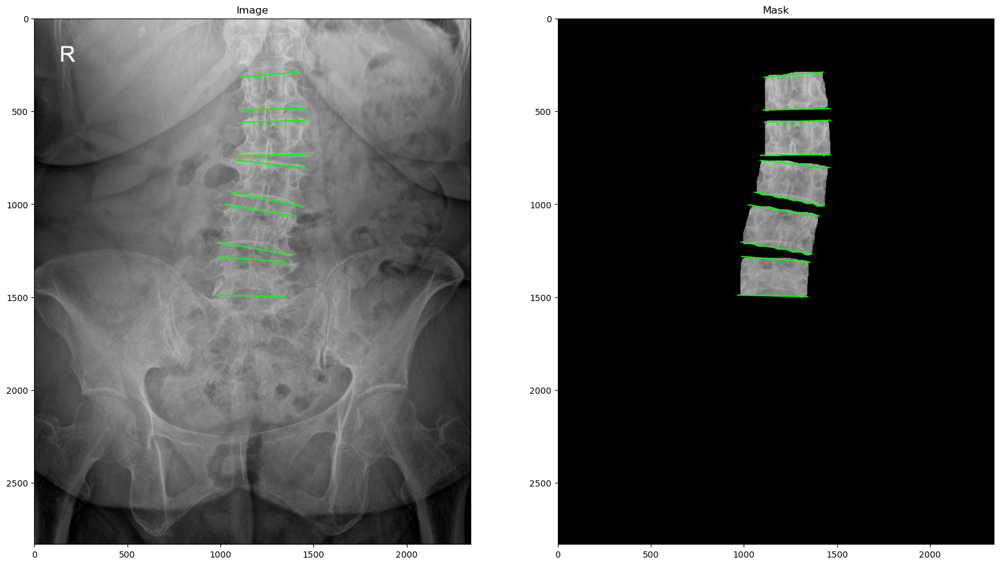

In [33]:

for file in LAPfiles[:1] :

    resutls      = model.predict(file, conf=0.5,device= '0')
    All_masking  = resutls[0].masks.data.cpu().numpy()
 
    D       = ReadAllBox_csv(file)

    
    # Load the image and mask
    img     = cv2.imread(file) 
    ximg    = img.copy()
   
    for i in range(5) :
      img = draw_box(img, D[i] , (0,255,0), 5)

    
  
    plt.figure(figsize=(20, 20))
    # Plot the image
    plt.subplot(121)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Image')

  
    
    for k in range(1,len(All_masking),1) :
        print(k)
        if k == 1 : 
          masking = cv2.bitwise_or(All_masking[k],All_masking[k-1])
        else :    
          masking = cv2.bitwise_or(All_masking[k],masking)
            
    masking = cv2.resize(masking, (img.shape[1],img.shape[0]  ))
    masking =  (masking*255).astype(np.uint8)    
    ximg    = cv2.bitwise_and(ximg, ximg , mask=masking)
        
    for i in range(5) :
      ximg = draw_box(ximg, D[i] , (0,255,0), 5)
    
    # Plot the mask
    plt.subplot(122)
    plt.imshow(ximg, cmap='gray')
    plt.title('Mask')



In [222]:



def Contour_To_Array(contour) :

    rect = cv2.minAreaRect(contour)
    box = cv2.boxPoints(rect)
    angle = rect[2]  # Angle in degrees
    sorted_box = sorted(box, key=lambda point: point[1])
    if sorted_box[0][0] > sorted_box[1][0]:
        top_right, top_left = sorted_box[0], sorted_box[1]
    else:
        top_left, top_right = sorted_box[0], sorted_box[1]
    
    if sorted_box[2][0] > sorted_box[3][0]:
        bottom_right, bottom_left = sorted_box[2], sorted_box[3]
    else:
        bottom_left, bottom_right = sorted_box[2], sorted_box[3]

    return top_right.tolist()+top_left.tolist()+bottom_right.tolist()+bottom_left.tolist()
    

for file in LAPfiles[:1] :

    resutls       = model.predict(file, conf=0.5,device= '0')
    List_contour  = resutls[0].masks.xyn
    D             = []

    print(file)
    for contour in List_contour :
       d = Contour_To_Array(contour)
       D.append(d)

    D = sorted(D, key=lambda point: point[1])    

     
    # # Load the image and mask
    # img     = cv2.imread(file) 
    
    # for i in range(2) :
    #   img = draw_box(img, D[i] , (0,255,0), 5)

    
  
    # plt.figure(figsize=(20, 20))
    # # Plot the image
    # plt.subplot(121)
    # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    # plt.title('Image')

       


image 1/1 /home/ubuntu/Lumbar-Spine-zero/BUU-LSPINE (Vertebral position)/train/AP/375_AP.jpg: 736x640 5 0s, 20.9ms
Speed: 4.1ms preprocess, 20.9ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 736)


BUU-LSPINE (Vertebral position)/train/AP/375_AP.jpg


In [256]:


import pandas as pd

df_test =pd.read_csv('position.csv')

df_test['Source_path'] = df_test['Image'].apply(lambda x: "./BUU-LSPINE (Vertebral position)/test/"+x )

df_test.rename(columns={'Image': 'id'}, inplace=True)

#df_test=df_test[df_test["Label"]=="AP"]

df_test

,id,Label,Source_path
0,575.jpg,LA,./BUU-LSPINE (Vertebral position)/test/575.jpg
1,422.jpg,AP,./BUU-LSPINE (Vertebral position)/test/422.jpg
2,477.jpg,AP,./BUU-LSPINE (Vertebral position)/test/477.jpg
3,564.jpg,LA,./BUU-LSPINE (Vertebral position)/test/564.jpg
4,547.jpg,LA,./BUU-LSPINE (Vertebral position)/test/547.jpg
...,...,...,...
195,551.jpg,LA,./BUU-LSPINE (Vertebral position)/test/551.jpg
196,588.jpg,LA,./BUU-LSPINE (Vertebral position)/test/588.jpg
197,415.jpg,AP,./BUU-LSPINE (Vertebral position)/test/415.jpg
198,498.jpg,AP,./BUU-LSPINE (Vertebral position)/test/498.jpg


In [257]:

df_sub0 =  pd.read_csv('submission.csv')

df_sub0

,id,L1a_1c,L1a_1r,L1a_2c,L1a_2r,L1b_1c,L1b_1r,L1b_2c,L1b_2r,L2a_1c,...,L5a_2c,L5a_2r,L5b_1c,L5b_1r,L5b_2c,L5b_2r,S1a_1c,S1a_1r,S1a_2c,S1a_2r
0,400.jpg,0.480183,0.172905,0.635919,0.172553,0.479318,0.237568,0.638514,0.236865,0.480183,...,0.650627,0.533474,0.449469,0.611492,0.645003,0.609383,0.0,0.0,0.0,0.0
1,401.jpg,0.411092,0.231355,0.574599,0.235011,0.409889,0.277942,0.582629,0.281381,0.410163,...,0.584391,0.538679,0.389754,0.595456,0.591272,0.596045,0.0,0.0,0.0,0.0
2,402.jpg,0.396312,0.204580,0.574163,0.202023,0.390244,0.261408,0.581631,0.257145,0.393512,...,0.627874,0.521254,0.404479,0.596111,0.623925,0.597828,0.0,0.0,0.0,0.0
3,403.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,404.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,595.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
196,596.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
197,597.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198,598.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [258]:

# Merge the DataFrames using 'inner' join
df_sub = pd.merge(df_sub0,df_test, on='id', how='inner')
df_sub

,id,L1a_1c,L1a_1r,L1a_2c,L1a_2r,L1b_1c,L1b_1r,L1b_2c,L1b_2r,L2a_1c,...,L5b_1c,L5b_1r,L5b_2c,L5b_2r,S1a_1c,S1a_1r,S1a_2c,S1a_2r,Label,Source_path
0,400.jpg,0.480183,0.172905,0.635919,0.172553,0.479318,0.237568,0.638514,0.236865,0.480183,...,0.449469,0.611492,0.645003,0.609383,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/400.jpg
1,401.jpg,0.411092,0.231355,0.574599,0.235011,0.409889,0.277942,0.582629,0.281381,0.410163,...,0.389754,0.595456,0.591272,0.596045,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/401.jpg
2,402.jpg,0.396312,0.204580,0.574163,0.202023,0.390244,0.261408,0.581631,0.257145,0.393512,...,0.404479,0.596111,0.623925,0.597828,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/402.jpg
3,403.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AP,./BUU-LSPINE (Vertebral position)/test/403.jpg
4,404.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AP,./BUU-LSPINE (Vertebral position)/test/404.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,595.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/595.jpg
196,596.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/596.jpg
197,597.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/597.jpg
198,598.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/598.jpg


In [259]:
column_name = df_sub.columns.tolist()
column_name

['id',
 'L1a_1c',
 'L1a_1r',
 'L1a_2c',
 'L1a_2r',
 'L1b_1c',
 'L1b_1r',
 'L1b_2c',
 'L1b_2r',
 'L2a_1c',
 'L2a_1r',
 'L2a_2c',
 'L2a_2r',
 'L2b_1c',
 'L2b_1r',
 'L2b_2c',
 'L2b_2r',
 'L3a_1c',
 'L3a_1r',
 'L3a_2c',
 'L3a_2r',
 'L3b_1c',
 'L3b_1r',
 'L3b_2c',
 'L3b_2r',
 'L4a_1c',
 'L4a_1r',
 'L4a_2c',
 'L4a_2r',
 'L4b_1c',
 'L4b_1r',
 'L4b_2c',
 'L4b_2r',
 'L5a_1c',
 'L5a_1r',
 'L5a_2c',
 'L5a_2r',
 'L5b_1c',
 'L5b_1r',
 'L5b_2c',
 'L5b_2r',
 'S1a_1c',
 'S1a_1r',
 'S1a_2c',
 'S1a_2r',
 'Label',
 'Source_path']

In [260]:
df_sub

,id,L1a_1c,L1a_1r,L1a_2c,L1a_2r,L1b_1c,L1b_1r,L1b_2c,L1b_2r,L2a_1c,...,L5b_1c,L5b_1r,L5b_2c,L5b_2r,S1a_1c,S1a_1r,S1a_2c,S1a_2r,Label,Source_path
0,400.jpg,0.480183,0.172905,0.635919,0.172553,0.479318,0.237568,0.638514,0.236865,0.480183,...,0.449469,0.611492,0.645003,0.609383,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/400.jpg
1,401.jpg,0.411092,0.231355,0.574599,0.235011,0.409889,0.277942,0.582629,0.281381,0.410163,...,0.389754,0.595456,0.591272,0.596045,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/401.jpg
2,402.jpg,0.396312,0.204580,0.574163,0.202023,0.390244,0.261408,0.581631,0.257145,0.393512,...,0.404479,0.596111,0.623925,0.597828,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/402.jpg
3,403.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AP,./BUU-LSPINE (Vertebral position)/test/403.jpg
4,404.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AP,./BUU-LSPINE (Vertebral position)/test/404.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,595.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/595.jpg
196,596.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/596.jpg
197,597.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/597.jpg
198,598.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/598.jpg


In [261]:
from tqdm import tqdm 

dfx = df_sub.copy()

for index, row in tqdm(df_sub.iterrows()):
     if index <= 2 : 
         continue
    
     if row['Label'] == "AP" :
         dfx.iloc[index,-6:-2]= 0.0
         file = row['Source_path']
         resutls       = model.predict(file, conf=0.5,device= '0')
         List_contour  = resutls[0].masks.xyn
         D             = []
         for contour in List_contour :
           d = Contour_To_Array(contour)
           D.append(d)

         D = sorted(D, key=lambda point: point[1])  
         Z = []
         for d in D :
            Z+=d
             
         #print(len(Z))
         dfx.iloc[index,1: min(40,len(Z))+1] = Z[0: min(40,len(Z))  ]    
        
         

0it [00:00, ?it/s]
image 1/1 /home/ubuntu/Lumbar-Spine-zero/BUU-LSPINE (Vertebral position)/test/403.jpg: 736x608 5 0s, 20.2ms
Speed: 4.6ms preprocess, 20.2ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)

image 1/1 /home/ubuntu/Lumbar-Spine-zero/BUU-LSPINE (Vertebral position)/test/404.jpg: 736x544 5 0s, 19.8ms
Speed: 3.3ms preprocess, 19.8ms inference, 2.8ms postprocess per image at shape (1, 3, 736, 736)
5it [00:00, 24.49it/s]
image 1/1 /home/ubuntu/Lumbar-Spine-zero/BUU-LSPINE (Vertebral position)/test/405.jpg: 736x544 5 0s, 18.7ms
Speed: 3.6ms preprocess, 18.7ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)

image 1/1 /home/ubuntu/Lumbar-Spine-zero/BUU-LSPINE (Vertebral position)/test/406.jpg: 736x608 6 0s, 21.1ms
Speed: 3.8ms preprocess, 21.1ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)

image 1/1 /home/ubuntu/Lumbar-Spine-zero/BUU-LSPINE (Vertebral position)/test/407.jpg: 736x608 5 0s, 20.7ms
Speed: 3.8ms preprocess, 20

In [229]:
dfx[dfx['Label']=='AP']

,id,L1a_1c,L1a_1r,L1a_2c,L1a_2r,L1b_1c,L1b_1r,L1b_2c,L1b_2r,L2a_1c,...,L5b_1c,L5b_1r,L5b_2c,L5b_2r,S1a_1c,S1a_1r,S1a_2c,S1a_2r,Label,Source_path
0,400.jpg,0.480183,0.172905,0.635919,0.172553,0.479318,0.237568,0.638514,0.236865,0.480183,...,0.449469,0.611492,0.645003,0.609383,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/400.jpg
1,401.jpg,0.411092,0.231355,0.574599,0.235011,0.409889,0.277942,0.582629,0.281381,0.410163,...,0.389754,0.595456,0.591272,0.596045,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/401.jpg
2,402.jpg,0.396312,0.204580,0.574163,0.202023,0.390244,0.261408,0.581631,0.257145,0.393512,...,0.404479,0.596111,0.623925,0.597828,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/402.jpg
3,403.jpg,0.531402,0.103261,0.400834,0.103261,0.531402,0.161685,0.400834,0.161685,0.538014,...,0.577013,0.502314,0.401246,0.514231,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/403.jpg
4,404.jpg,0.592863,0.184783,0.446936,0.184783,0.592863,0.243207,0.446936,0.243207,0.600254,...,0.628871,0.588315,0.439355,0.588315,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/404.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,495.jpg,0.565765,0.157609,0.421793,0.157609,0.565765,0.210598,0.421793,0.210598,0.563987,...,0.560433,0.521739,0.393354,0.521739,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/495.jpg
96,496.jpg,0.556160,0.135870,0.440536,0.135870,0.556160,0.190217,0.440536,0.190217,0.557812,...,0.575982,0.532609,0.414108,0.532609,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/496.jpg
97,497.jpg,0.576090,0.146739,0.453685,0.146739,0.576090,0.198370,0.453685,0.198370,0.584360,...,0.592631,0.529891,0.420602,0.529891,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/497.jpg
98,498.jpg,0.592763,0.168478,0.392591,0.168478,0.592763,0.235054,0.392591,0.235054,0.592763,...,0.658914,0.585376,0.402412,0.588658,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/498.jpg


dfx.to_csv('output.csv', index=False)

In [262]:
dfx.to_csv('outputz.csv', index=False)

In [263]:
dfx

,id,L1a_1c,L1a_1r,L1a_2c,L1a_2r,L1b_1c,L1b_1r,L1b_2c,L1b_2r,L2a_1c,...,L5b_1c,L5b_1r,L5b_2c,L5b_2r,S1a_1c,S1a_1r,S1a_2c,S1a_2r,Label,Source_path
0,400.jpg,0.480183,0.172905,0.635919,0.172553,0.479318,0.237568,0.638514,0.236865,0.480183,...,0.449469,0.611492,0.645003,0.609383,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/400.jpg
1,401.jpg,0.411092,0.231355,0.574599,0.235011,0.409889,0.277942,0.582629,0.281381,0.410163,...,0.389754,0.595456,0.591272,0.596045,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/401.jpg
2,402.jpg,0.396312,0.204580,0.574163,0.202023,0.390244,0.261408,0.581631,0.257145,0.393512,...,0.404479,0.596111,0.623925,0.597828,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/402.jpg
3,403.jpg,0.531402,0.103261,0.400834,0.103261,0.531402,0.161685,0.400834,0.161685,0.538014,...,0.577013,0.502314,0.401246,0.514231,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/403.jpg
4,404.jpg,0.592863,0.184783,0.446936,0.184783,0.592863,0.243207,0.446936,0.243207,0.600254,...,0.628871,0.588315,0.439355,0.588315,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/404.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,595.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/595.jpg
196,596.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/596.jpg
197,597.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/597.jpg
198,598.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/598.jpg


In [ ]:

# if os.path.exists("datasets"):
#      shutil.rmtree("datasets")

In [264]:
dfx = dfx.drop(['Label','Source_path'],axis=1)

dfx

,id,L1a_1c,L1a_1r,L1a_2c,L1a_2r,L1b_1c,L1b_1r,L1b_2c,L1b_2r,L2a_1c,...,L5a_2c,L5a_2r,L5b_1c,L5b_1r,L5b_2c,L5b_2r,S1a_1c,S1a_1r,S1a_2c,S1a_2r
0,400.jpg,0.480183,0.172905,0.635919,0.172553,0.479318,0.237568,0.638514,0.236865,0.480183,...,0.650627,0.533474,0.449469,0.611492,0.645003,0.609383,0.0,0.0,0.0,0.0
1,401.jpg,0.411092,0.231355,0.574599,0.235011,0.409889,0.277942,0.582629,0.281381,0.410163,...,0.584391,0.538679,0.389754,0.595456,0.591272,0.596045,0.0,0.0,0.0,0.0
2,402.jpg,0.396312,0.204580,0.574163,0.202023,0.390244,0.261408,0.581631,0.257145,0.393512,...,0.627874,0.521254,0.404479,0.596111,0.623925,0.597828,0.0,0.0,0.0,0.0
3,403.jpg,0.531402,0.103261,0.400834,0.103261,0.531402,0.161685,0.400834,0.161685,0.538014,...,0.396298,0.441253,0.577013,0.502314,0.401246,0.514231,0.0,0.0,0.0,0.0
4,404.jpg,0.592863,0.184783,0.446936,0.184783,0.592863,0.243207,0.446936,0.243207,0.600254,...,0.439355,0.516304,0.628871,0.588315,0.439355,0.588315,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,595.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
196,596.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
197,597.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198,598.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [265]:
dfxk = dfx.copy()

In [270]:

dfxk = dfxk.fillna(0.0)

In [272]:
dfxk.to_csv('sub4.csv', index=False)

In [271]:
dfxk

,id,L1a_1c,L1a_1r,L1a_2c,L1a_2r,L1b_1c,L1b_1r,L1b_2c,L1b_2r,L2a_1c,...,L5a_2c,L5a_2r,L5b_1c,L5b_1r,L5b_2c,L5b_2r,S1a_1c,S1a_1r,S1a_2c,S1a_2r
0,400.jpg,0.480183,0.172905,0.635919,0.172553,0.479318,0.237568,0.638514,0.236865,0.480183,...,0.650627,0.533474,0.449469,0.611492,0.645003,0.609383,0.0,0.0,0.0,0.0
1,401.jpg,0.411092,0.231355,0.574599,0.235011,0.409889,0.277942,0.582629,0.281381,0.410163,...,0.584391,0.538679,0.389754,0.595456,0.591272,0.596045,0.0,0.0,0.0,0.0
2,402.jpg,0.396312,0.204580,0.574163,0.202023,0.390244,0.261408,0.581631,0.257145,0.393512,...,0.627874,0.521254,0.404479,0.596111,0.623925,0.597828,0.0,0.0,0.0,0.0
3,403.jpg,0.531402,0.103261,0.400834,0.103261,0.531402,0.161685,0.400834,0.161685,0.538014,...,0.396298,0.441253,0.577013,0.502314,0.401246,0.514231,0.0,0.0,0.0,0.0
4,404.jpg,0.592863,0.184783,0.446936,0.184783,0.592863,0.243207,0.446936,0.243207,0.600254,...,0.439355,0.516304,0.628871,0.588315,0.439355,0.588315,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,595.jpg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
196,596.jpg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
197,597.jpg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
198,598.jpg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
